   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.0/137.0 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 22.6 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 63.1 MB/s eta 0:00:0000:010:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████████| 161M/161M [00:00<00:00, 234MB/s] 


Epoch 1/30 | Train Loss: 0.2203 | Val Loss: 0.1442
✅ Best model saved at epoch 1 with val_loss=0.1442
Epoch 2/30 | Train Loss: 0.1369 | Val Loss: 0.1302
✅ Best model saved at epoch 2 with val_loss=0.1302
Epoch 3/30 | Train Loss: 0.1230 | Val Loss: 0.1229
✅ Best model saved at epoch 3 with val_loss=0.1229
Epoch 4/30 | Train Loss: 0.1142 | Val Loss: 0.1199
✅ Best model saved at epoch 4 with val_loss=0.1199
Epoch 5/30 | Train Loss: 0.1076 | Val Loss: 0.1180
✅ Best model saved at epoch 5 with val_loss=0.1180
Epoch 6/30 | Train Loss: 0.1006 | Val Loss: 0.1200
Epoch 7/30 | Train Loss: 0.0951 | Val Loss: 0.1173
✅ Best model saved at epoch 7 with val_loss=0.1173
Epoch 8/30 | Train Loss: 0.0897 | Val Loss: 0.1214
Epoch 9/30 | Train Loss: 0.0856 | Val Loss: 0.1217
Epoch 10/30 | Train Loss: 0.0826 | Val Loss: 0.1259
Epoch 11/30 | Train Loss: 0.0787 | Val Loss: 0.1200
Epoch 12/30 | Train Loss: 0.0761 | Val Loss: 0.1323
Epoch 13/30 | Train Loss: 0.0735 | Val Loss: 0.1335
Epoch 14/30 | Train Loss: 0

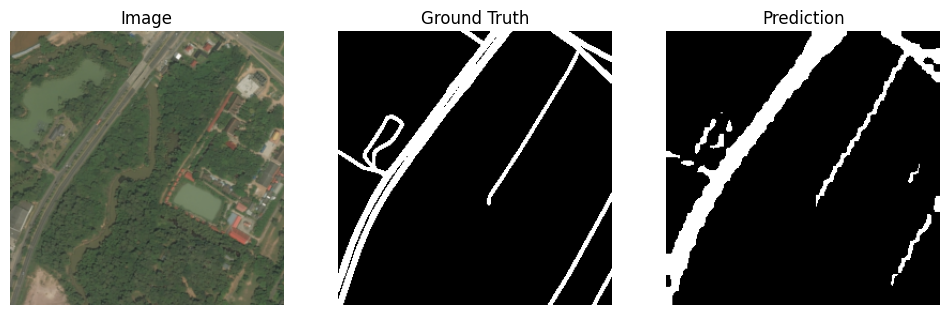

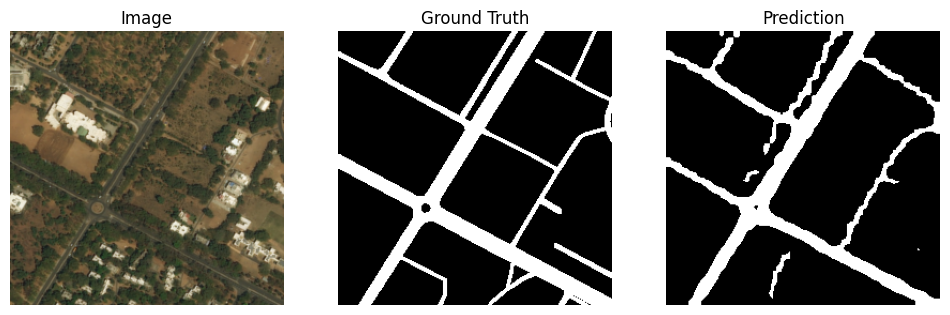

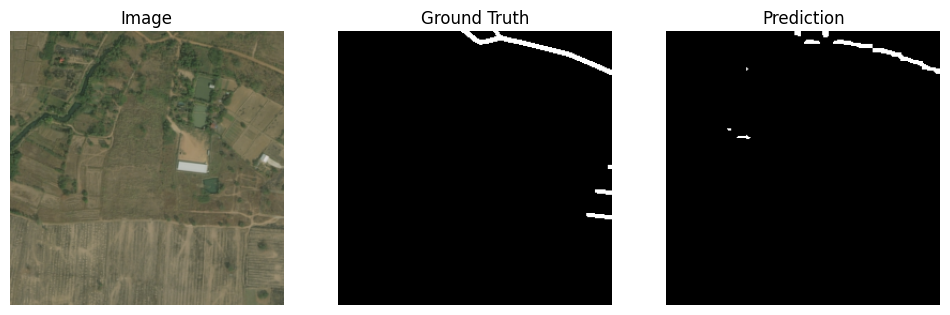

In [1]:
# ======================================================
# STEP 1: Install dependencies
# ======================================================
!pip install -q segmentation-models-pytorch albumentations==1.4.3
# ======================================================
# STEP 1: Imports
# ======================================================
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import torchvision.models.segmentation as models

# ======================================================
# STEP 2: Paths
# ======================================================
DATASET_DIR = "/kaggle/input/deepglobe-road-extraction-organized"

images_dir = os.path.join(DATASET_DIR, "image")
masks_dir = os.path.join(DATASET_DIR, "mask")

image_files = sorted(os.listdir(images_dir))
mask_files = sorted(os.listdir(masks_dir))

print("Total images:", len(image_files))
print("Total masks:", len(mask_files))

# ======================================================
# STEP 3: Train/Validation Split
# ======================================================
train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    image_files, mask_files, test_size=0.2, random_state=42
)

print("Train size:", len(train_imgs), "Val size:", len(val_imgs))

# ======================================================
# STEP 4: Dataset Class
# ======================================================
class RoadDataset(Dataset):
    def __init__(self, img_list, mask_list, img_dir, mask_dir, transform=None):
        self.img_list = img_list
        self.mask_list = mask_list
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transform = transform

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_list[idx])
        mask_path = os.path.join(self.mask_dir, self.mask_list[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")  # grayscale

        if self.transform is not None:
            image = self.transform(image)
            mask = self.transform(mask)

        # Convert mask: {0,255} → {0,1}
        mask = (mask > 0).float()

        return image, mask

# ======================================================
# STEP 5: Transforms
# ======================================================
transform_img = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
])

transform_mask = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
])

train_dataset = RoadDataset(train_imgs, train_masks, images_dir, masks_dir,
                            transform=transform_img)
val_dataset = RoadDataset(val_imgs, val_masks, images_dir, masks_dir,
                          transform=transform_img)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

# ======================================================
# STEP 6: Model
# ======================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.deeplabv3_resnet50(pretrained=True)
model.classifier[4] = nn.Conv2d(256, 1, kernel_size=1)  # 1 class (road)
model = model.to(device)

# Loss + Optimizer
loss_fn = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# ======================================================
# STEP 7: Training & Evaluation Functions
# ======================================================
def train_one_epoch(loader, model, optimizer, loss_fn, device):
    model.train()
    running_loss = 0.0
    for images, masks in loader:
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)["out"]
        loss = loss_fn(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
    return running_loss / len(loader.dataset)

def eval_one_epoch(loader, model, loss_fn, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)["out"]
            loss = loss_fn(outputs, masks)
            running_loss += loss.item() * images.size(0)
    return running_loss / len(loader.dataset)

# ======================================================
# STEP 8: Train with Automatic Checkpoint Saving
# ======================================================
EPOCHS = 30
best_val_loss = float("inf")
BEST_MODEL_PATH = "deeplabv3_best.pth"
LAST_MODEL_PATH = "deeplabv3_last.pth"

for epoch in range(EPOCHS):
    train_loss = train_one_epoch(train_loader, model, optimizer, loss_fn, device)
    val_loss = eval_one_epoch(val_loader, model, loss_fn, device)

    print(f"Epoch {epoch+1}/{EPOCHS} | "
          f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        print(f"✅ Best model saved at epoch {epoch+1} with val_loss={val_loss:.4f}")

# Save last model at the end
torch.save(model.state_dict(), LAST_MODEL_PATH)
print(f"💾 Final model saved at {LAST_MODEL_PATH}")

# ======================================================
# STEP 9: Show Sample Predictions
# ======================================================
model.eval()
images, masks = next(iter(val_loader))
images, masks = images.to(device), masks.to(device)
with torch.no_grad():
    outputs = torch.sigmoid(model(images)["out"])
    preds = (outputs > 0.5).float()

# Plot first 3 samples
for i in range(3):
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.imshow(images[i].permute(1,2,0).cpu())
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(masks[i][0].cpu(), cmap="gray")
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(preds[i][0].cpu(), cmap="gray")
    plt.title("Prediction")
    plt.axis("off")

    plt.show()


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 173MB/s]


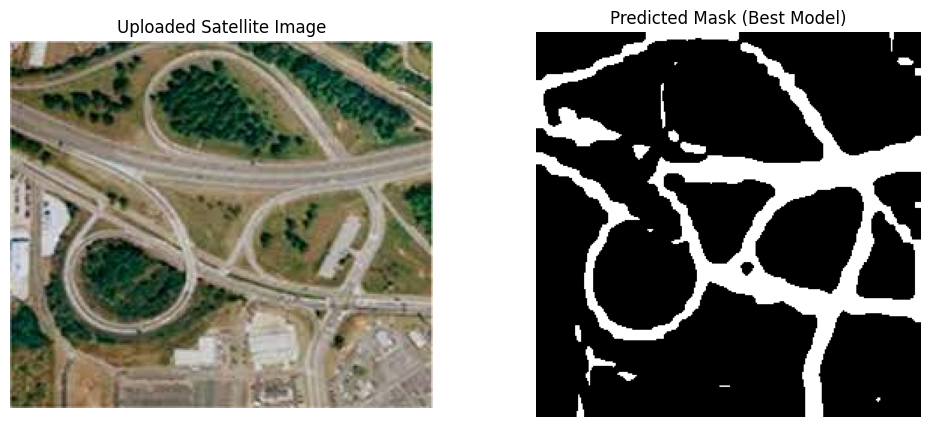

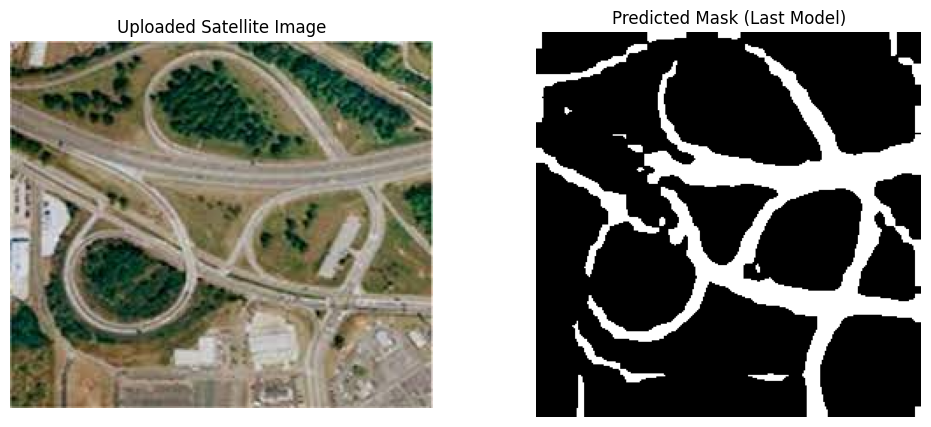

In [2]:
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as T
import torch
import torchvision.models.segmentation as models

# ======================================================
# Common Setup
# ======================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Paths to saved checkpoints
BEST_MODEL_PATH = "deeplabv3_best.pth"
LAST_MODEL_PATH = "deeplabv3_last.pth"

# Image path (your uploaded test image)
img_path = "/kaggle/input/testimage/images (1).jpeg"

# Preprocessing
transform_img = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
])

# Load image
image = Image.open(img_path).convert("RGB")
input_tensor = transform_img(image).unsqueeze(0).to(device)

# ======================================================
# 1. Load Best Model and Test
# ======================================================
best_model = models.deeplabv3_resnet50(weights=None, aux_loss=True)
best_model.classifier[4] = torch.nn.Conv2d(256, 1, kernel_size=1)
best_model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
best_model = best_model.to(device)
best_model.eval()

with torch.no_grad():
    output_best = torch.sigmoid(best_model(input_tensor)["out"])
    pred_mask_best = (output_best > 0.5).float()

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Uploaded Satellite Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(pred_mask_best[0][0].cpu(), cmap="gray")
plt.title("Predicted Mask (Best Model)")
plt.axis("off")
plt.show()

# ======================================================
# 2. Load Last Model and Test
# ======================================================
last_model = models.deeplabv3_resnet50(weights=None, aux_loss=True)
last_model.classifier[4] = torch.nn.Conv2d(256, 1, kernel_size=1)
last_model.load_state_dict(torch.load(LAST_MODEL_PATH, map_location=device))
last_model = last_model.to(device)
last_model.eval()

with torch.no_grad():
    output_last = torch.sigmoid(last_model(input_tensor)["out"])
    pred_mask_last = (output_last > 0.5).float()

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Uploaded Satellite Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(pred_mask_last[0][0].cpu(), cmap="gray")
plt.title("Predicted Mask (Last Model)")
plt.axis("off")
plt.show()


In [3]:
import os
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np

# -----------------------------
# Dataset Class for Binary Segmentation
# -----------------------------
class RoadSegDataset(Dataset):
    def __init__(self, img_dir, mask_dir, transform_img=None, transform_mask=None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.images = sorted(os.listdir(img_dir))
        self.masks = sorted(os.listdir(mask_dir))
        self.transform_img = transform_img
        self.transform_mask = transform_mask

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.masks[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")  # grayscale mask

        if self.transform_img:
            image = self.transform_img(image)
        if self.transform_mask:
            mask = self.transform_mask(mask)

        mask = (mask > 0.5).float()  # ensure binary {0,1}
        return image, mask

# -----------------------------
# Transforms
# -----------------------------
transform_img = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

transform_mask = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

# -----------------------------
# Dataset + DataLoader
# -----------------------------
IMG_DIR = "/kaggle/input/deepglobe-road-extraction-organized/image"   # <-- change to your folder
MASK_DIR = "/kaggle/input/deepglobe-road-extraction-organized/mask"   # <-- change to your folder

dataset = RoadSegDataset(IMG_DIR, MASK_DIR, transform_img, transform_mask)
loader = DataLoader(dataset, batch_size=4, shuffle=False)

# -----------------------------
# Load Trained Model (ignore aux_classifier mismatch)
# -----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = torch.hub.load("pytorch/vision:v0.13.0", "deeplabv3_resnet50", pretrained=False)
model.classifier[4] = nn.Conv2d(256, 1, kernel_size=1)

# Load checkpoint and remove aux_classifier keys
checkpoint = torch.load("deeplabv3_last.pth", map_location=device)
new_state_dict = {k: v for k, v in checkpoint.items() if not k.startswith("aux_classifier")}

# Load only matching keys
model.load_state_dict(new_state_dict, strict=False)

model = model.to(device)
model.eval()


# -----------------------------
# Metrics Functions
# -----------------------------
def pixel_accuracy(output, mask):
    correct = (output == mask).sum().item()
    total = mask.numel()
    return correct / total

def iou_score(output, mask):
    intersection = (output & mask).sum().float()
    union = (output | mask).sum().float()
    return (intersection / union).item() if union > 0 else 0.0

def dice_score(output, mask):
    intersection = (output & mask).sum().float()
    return (2 * intersection / (output.sum() + mask.sum())).item()

# -----------------------------
# Evaluation Loop
# -----------------------------
accs, ious, dices = [], [], []

with torch.no_grad():
    for imgs, masks in loader:
        imgs, masks = imgs.to(device), masks.to(device)

        preds = torch.sigmoid(model(imgs)["out"])
        preds = (preds > 0.5).float()

        for i in range(len(imgs)):
            accs.append(pixel_accuracy(preds[i,0], masks[i,0]))
            ious.append(iou_score(preds[i,0].bool(), masks[i,0].bool()))
            dices.append(dice_score(preds[i,0].bool(), masks[i,0].bool()))

print(f"Pixel Accuracy: {np.mean(accs):.4f}")
print(f"IoU Score: {np.mean(ious):.4f}")
print(f"Dice Score: {np.mean(dices):.4f}")


Downloading: "https://github.com/pytorch/vision/zipball/v0.13.0" to /root/.cache/torch/hub/v0.13.0.zip
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Pixel Accuracy: 0.9613
IoU Score: 0.4792
Dice Score: 0.6386


Missing keys: []
Unexpected keys: ['aux_classifier.0.weight', 'aux_classifier.1.weight', 'aux_classifier.1.bias', 'aux_classifier.1.running_mean', 'aux_classifier.1.running_var', 'aux_classifier.1.num_batches_tracked', 'aux_classifier.4.weight', 'aux_classifier.4.bias']


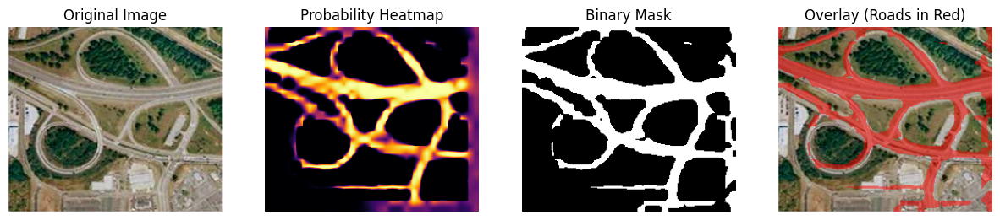

In [4]:
# ================================
# Full DeepLabV3 Inference Script
# ================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# -------------------------------
# Model definition
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    missing, unexpected = model.load_state_dict(state, strict=False)
    print("Missing keys:", missing)
    print("Unexpected keys:", unexpected)
    return model

# -------------------------------
# Image utils
# -------------------------------
def load_rgb_image(path):
    img = Image.open(path).convert("RGB")
    return img

def preprocess_image(path, max_dim=512):
    img = load_rgb_image(path)
    orig_size = img.size[::-1]  # (H, W)
    img.thumbnail((max_dim, max_dim))
    return img, orig_size

def simple_box_blur(mask_np, k=5):
    h, w = mask_np.shape
    integ = np.pad(mask_np, ((1,0),(1,0)), "constant").cumsum(0).cumsum(1)
    out = np.zeros_like(mask_np)
    for y in range(h):
        for x in range(w):
            y0, x0 = max(0,y-k//2), max(0,x-k//2)
            y1, x1 = min(h,y+k//2+1), min(w,x+k//2+1)
            s = integ[y1,x1] - integ[y0,x1] - integ[y1,x0] + integ[y0,x0]
            out[y,x] = s / ((y1-y0)*(x1-x0))
    return out

def overlay_mask_on_image(image_pil, mask_np, alpha=0.5, color=(255,0,0)):
    img = np.array(image_pil).astype(np.uint8)
    overlay = img.copy()
    overlay[mask_np > 0] = color
    blended = (img * (1 - alpha) + overlay * alpha).astype(np.uint8)
    return blended

# -------------------------------
# Inference function
# -------------------------------
@torch.inference_mode()
def infer_coarse_mask(
    weights_path,
    image_path,
    device="cuda",
    max_dim=512,
    threshold=0.5,
    smooth_kernel=None
):
    # Load model
    model = load_deeplabv3(weights_path, device=device)
    model.eval()

    # Preprocess
    img_pil, orig_size = preprocess_image(image_path, max_dim=max_dim)
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    # Forward
    out = model(img_tensor)["out"]
    prob = torch.sigmoid(out)[0, 0].cpu().numpy()

    # Optional smoothing
    if smooth_kernel and smooth_kernel >= 3 and smooth_kernel % 2 == 1:
        prob = simple_box_blur(prob, smooth_kernel)

    # Threshold -> binary mask
    mask = (prob >= threshold).astype(np.uint8) * 255
    mask_resized = np.array(Image.fromarray(mask).resize(orig_size[::-1], Image.NEAREST))

    # Overlay
    orig_pil = load_rgb_image(image_path)
    overlay = overlay_mask_on_image(orig_pil, mask_resized, alpha=0.5, color=(255,0,0))

    # Show results
    plt.figure(figsize=(15,5))

    plt.subplot(1,4,1)
    plt.imshow(orig_pil)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,4,2)
    plt.imshow(prob, cmap="inferno")
    plt.title("Probability Heatmap")
    plt.axis("off")

    plt.subplot(1,4,3)
    plt.imshow(mask_resized, cmap="gray")
    plt.title("Binary Mask")
    plt.axis("off")

    plt.subplot(1,4,4)
    plt.imshow(overlay)
    plt.title("Overlay (Roads in Red)")
    plt.axis("off")

    plt.show()


# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"   # change to your weights
IMAGE_PATH   = "/kaggle/input/testimage/images (1).jpeg" # change to your image

infer_coarse_mask(
    weights_path=WEIGHTS_PATH,
    image_path=IMAGE_PATH,
    device="cuda" if torch.cuda.is_available() else "cpu",
    max_dim=512,
    threshold=0.3,   # try lower like 0.3 if black mask issue
    smooth_kernel=None
)


In [5]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth


--2025-08-31 15:29:24--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.227.219.33, 13.227.219.59, 13.227.219.70, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.227.219.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375042383 (358M) [binary/octet-stream]
Saving to: ‘sam_vit_b_01ec64.pth’

sam_vit_b_01ec64.pt 100%[===================>] 357.67M  54.8MB/s    in 6.7s    

2025-08-31 15:29:30 (53.6 MB/s) - ‘sam_vit_b_01ec64.pth’ saved [375042383/375042383]



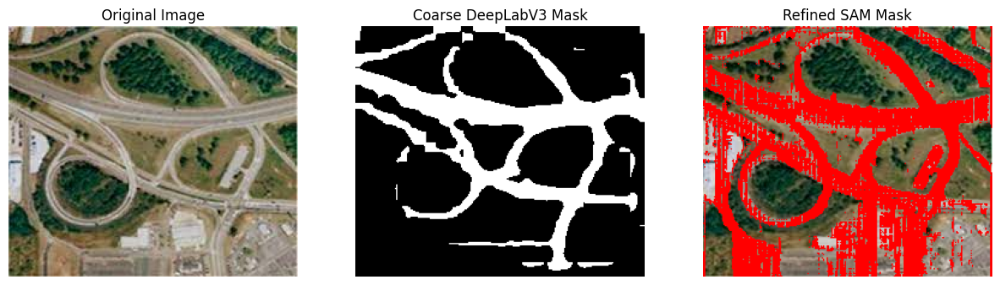

In [6]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement (Fixed)
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()   # <<< FIX: set eval mode
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Full Pipeline
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Coarse DeepLabV3 mask
    model = load_deeplabv3(weights_path, device)
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Visualization
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    plt.subplot(1,3,3)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]  # red overlay
    plt.imshow(overlay)
    plt.title("Refined SAM Mask"); plt.axis("off")

    plt.show()

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         # your DeepLabV3 weights
IMAGE_PATH   = "/kaggle/input/testimage/images (1).jpeg"      # your input image
SAM_CKPT     = "sam_vit_b_01ec64.pth"          # SAM checkpoint

run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")


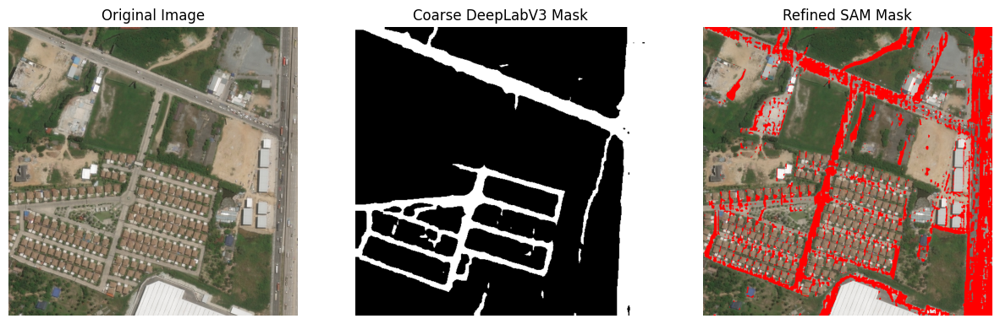

In [7]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement (Fixed)
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()   # <<< FIX: set eval mode
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Full Pipeline
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Coarse DeepLabV3 mask
    model = load_deeplabv3(weights_path, device)
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Visualization
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    plt.subplot(1,3,3)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]  # red overlay
    plt.imshow(overlay)
    plt.title("Refined SAM Mask"); plt.axis("off")

    plt.show()

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         # your DeepLabV3 weights
IMAGE_PATH   = "/kaggle/input/testimageindataset/image2.jpg"      # your input image
SAM_CKPT     = "sam_vit_b_01ec64.pth"          # SAM checkpoint

run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")


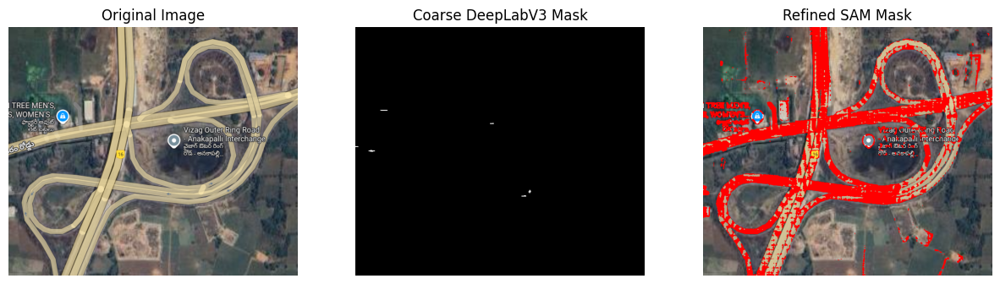

In [8]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement (Fixed)
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()   # <<< FIX: set eval mode
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Full Pipeline
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Coarse DeepLabV3 mask
    model = load_deeplabv3(weights_path, device)
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Visualization
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    plt.subplot(1,3,3)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]  # red overlay
    plt.imshow(overlay)
    plt.title("Refined SAM Mask"); plt.axis("off")

    plt.show()

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         # your DeepLabV3 weights
IMAGE_PATH   = "/kaggle/input/owndata/Screenshot 2025-08-23 233815.png"      # your input image
SAM_CKPT     = "sam_vit_b_01ec64.pth"          # SAM checkpoint

run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")


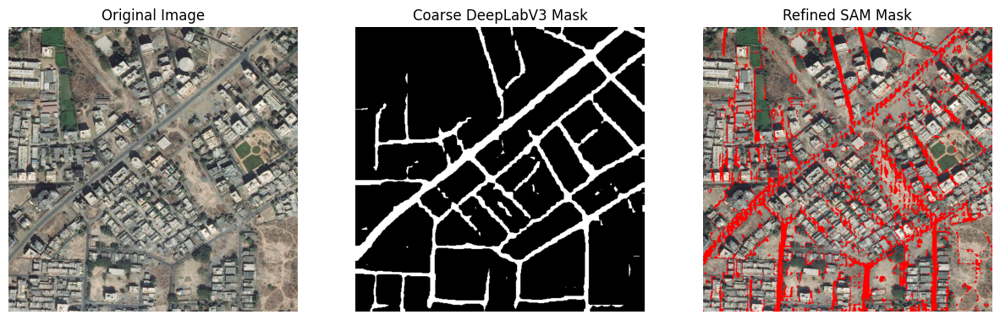

In [9]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement (Fixed)
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()   # <<< FIX: set eval mode
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Full Pipeline
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Coarse DeepLabV3 mask
    model = load_deeplabv3(weights_path, device)
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Visualization
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    plt.subplot(1,3,3)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]  # red overlay
    plt.imshow(overlay)
    plt.title("Refined SAM Mask"); plt.axis("off")

    plt.show()

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         # your DeepLabV3 weights
IMAGE_PATH   = "/kaggle/input/asdfghj/Screenshot 2025-08-23 234339.png"      # your input image
SAM_CKPT     = "sam_vit_b_01ec64.pth"          # SAM checkpoint

run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")


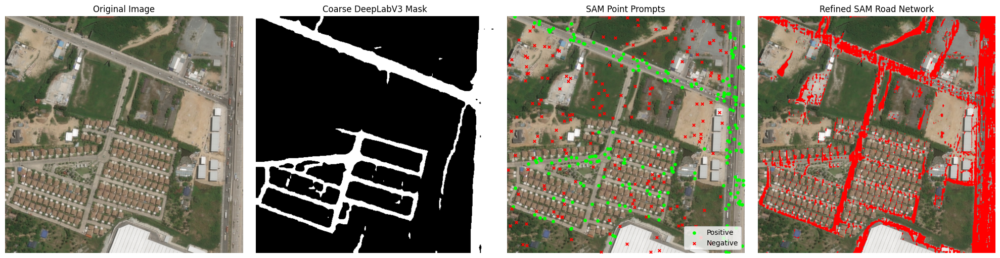

In [10]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Full Pipeline with Visualization
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Step 1: Coarse DeepLabV3 mask
    model = load_deeplabv3(weights_path, device)
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization (4 stages)
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/testimageindataset/image2.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")


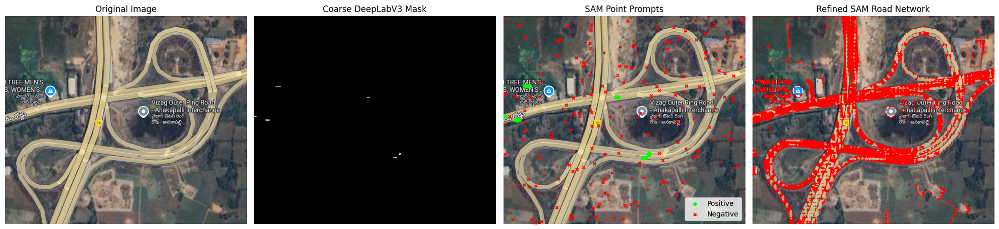

In [11]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Full Pipeline with Visualization
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Step 1: Coarse DeepLabV3 mask
    model = load_deeplabv3(weights_path, device)
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization (4 stages)
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/owndata/Screenshot 2025-08-23 233815.png"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")


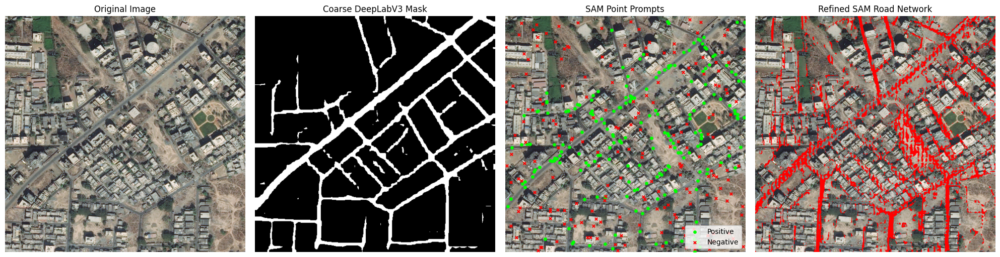

In [12]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Full Pipeline with Visualization
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Step 1: Coarse DeepLabV3 mask
    model = load_deeplabv3(weights_path, device)
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization (4 stages)
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/asdfghj/Screenshot 2025-08-23 234339.png"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")


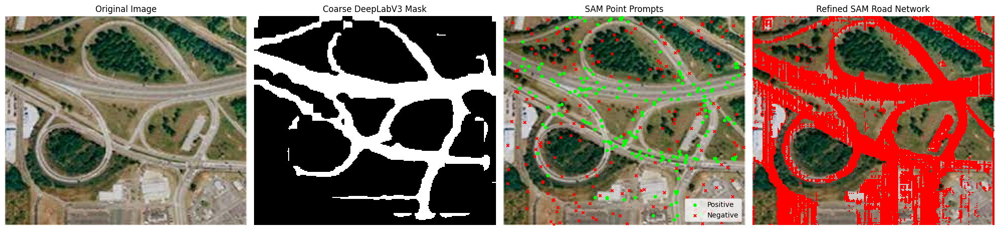

In [13]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Full Pipeline with Visualization
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Step 1: Coarse DeepLabV3 mask
    model = load_deeplabv3(weights_path, device)
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization (4 stages)
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/testimage/images (1).jpeg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")


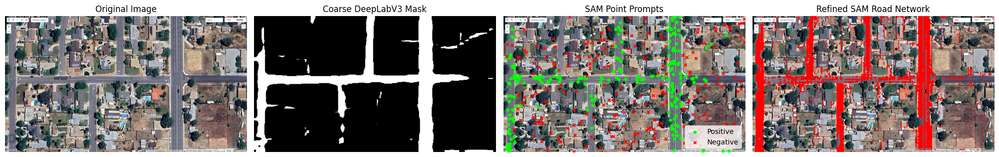

In [24]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os, glob

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Visualization Helper
# -------------------------------
def visualize_all(image, coarse_mask, points, labels, refined_mask):
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# 5. Run Pipeline (Single Image)
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load model once
    model = load_deeplabv3(weights_path, device)

    # Step 1: Coarse DeepLabV3 mask
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization
    visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# 6. Run Pipeline on Folder
# -------------------------------
def run_on_folder(weights_path, folder_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = load_deeplabv3(weights_path, device)

    image_paths = sorted(glob.glob(os.path.join(folder_path, "*.png")) + 
                         glob.glob(os.path.join(folder_path, "*.jpg")) + 
                         glob.glob(os.path.join(folder_path, "*.jpeg")))

    print(f"Found {len(image_paths)} images in {folder_path}")
    for img_path in image_paths:
        print(f"\nProcessing: {os.path.basename(img_path)}")
        image, coarse_mask = get_coarse_mask(model, img_path, device=device, threshold=0.4)
        points, labels = mask_to_points(coarse_mask, num_points=200)
        refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)
        visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/roadimages9/image7.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

# Single image
run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")

# OR run on a folder
# FOLDER_PATH  = "/kaggle/input/roadimages9/"
# run_on_folder(WEIGHTS_PATH, FOLDER_PATH, SAM_CKPT, model_type="vit_b")


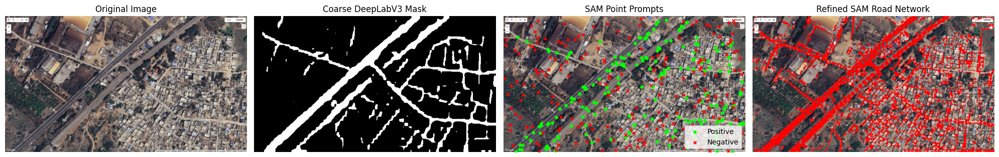

In [25]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os, glob

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Visualization Helper
# -------------------------------
def visualize_all(image, coarse_mask, points, labels, refined_mask):
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# 5. Run Pipeline (Single Image)
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load model once
    model = load_deeplabv3(weights_path, device)

    # Step 1: Coarse DeepLabV3 mask
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization
    visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# 6. Run Pipeline on Folder
# -------------------------------
def run_on_folder(weights_path, folder_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = load_deeplabv3(weights_path, device)

    image_paths = sorted(glob.glob(os.path.join(folder_path, "*.png")) + 
                         glob.glob(os.path.join(folder_path, "*.jpg")) + 
                         glob.glob(os.path.join(folder_path, "*.jpeg")))

    print(f"Found {len(image_paths)} images in {folder_path}")
    for img_path in image_paths:
        print(f"\nProcessing: {os.path.basename(img_path)}")
        image, coarse_mask = get_coarse_mask(model, img_path, device=device, threshold=0.4)
        points, labels = mask_to_points(coarse_mask, num_points=200)
        refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)
        visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/roadimages9/image1.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

# Single image
run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")

# OR run on a folder
# FOLDER_PATH  = "/kaggle/input/roadimages9/"
# run_on_folder(WEIGHTS_PATH, FOLDER_PATH, SAM_CKPT, model_type="vit_b")


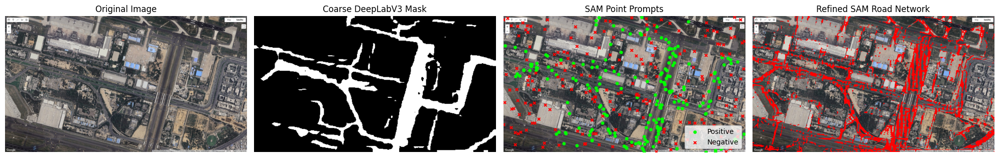

In [26]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os, glob

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Visualization Helper
# -------------------------------
def visualize_all(image, coarse_mask, points, labels, refined_mask):
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# 5. Run Pipeline (Single Image)
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load model once
    model = load_deeplabv3(weights_path, device)

    # Step 1: Coarse DeepLabV3 mask
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization
    visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# 6. Run Pipeline on Folder
# -------------------------------
def run_on_folder(weights_path, folder_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = load_deeplabv3(weights_path, device)

    image_paths = sorted(glob.glob(os.path.join(folder_path, "*.png")) + 
                         glob.glob(os.path.join(folder_path, "*.jpg")) + 
                         glob.glob(os.path.join(folder_path, "*.jpeg")))

    print(f"Found {len(image_paths)} images in {folder_path}")
    for img_path in image_paths:
        print(f"\nProcessing: {os.path.basename(img_path)}")
        image, coarse_mask = get_coarse_mask(model, img_path, device=device, threshold=0.4)
        points, labels = mask_to_points(coarse_mask, num_points=200)
        refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)
        visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/roadimages9/image2.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

# Single image
run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")

# OR run on a folder
# FOLDER_PATH  = "/kaggle/input/roadimages9/"
# run_on_folder(WEIGHTS_PATH, FOLDER_PATH, SAM_CKPT, model_type="vit_b")


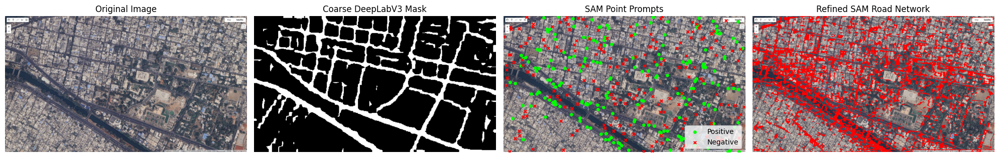

In [27]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os, glob

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Visualization Helper
# -------------------------------
def visualize_all(image, coarse_mask, points, labels, refined_mask):
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# 5. Run Pipeline (Single Image)
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load model once
    model = load_deeplabv3(weights_path, device)

    # Step 1: Coarse DeepLabV3 mask
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization
    visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# 6. Run Pipeline on Folder
# -------------------------------
def run_on_folder(weights_path, folder_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = load_deeplabv3(weights_path, device)

    image_paths = sorted(glob.glob(os.path.join(folder_path, "*.png")) + 
                         glob.glob(os.path.join(folder_path, "*.jpg")) + 
                         glob.glob(os.path.join(folder_path, "*.jpeg")))

    print(f"Found {len(image_paths)} images in {folder_path}")
    for img_path in image_paths:
        print(f"\nProcessing: {os.path.basename(img_path)}")
        image, coarse_mask = get_coarse_mask(model, img_path, device=device, threshold=0.4)
        points, labels = mask_to_points(coarse_mask, num_points=200)
        refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)
        visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/roadimages9/image3.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

# Single image
run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")

# OR run on a folder
# FOLDER_PATH  = "/kaggle/input/roadimages9/"
# run_on_folder(WEIGHTS_PATH, FOLDER_PATH, SAM_CKPT, model_type="vit_b")


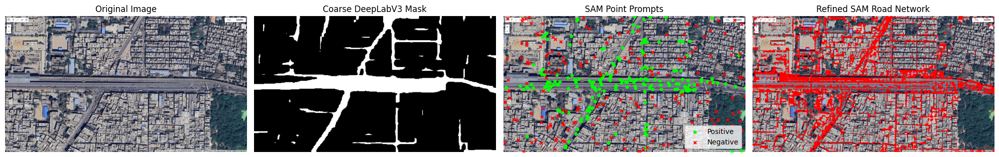

In [28]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os, glob

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Visualization Helper
# -------------------------------
def visualize_all(image, coarse_mask, points, labels, refined_mask):
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# 5. Run Pipeline (Single Image)
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load model once
    model = load_deeplabv3(weights_path, device)

    # Step 1: Coarse DeepLabV3 mask
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization
    visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# 6. Run Pipeline on Folder
# -------------------------------
def run_on_folder(weights_path, folder_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = load_deeplabv3(weights_path, device)

    image_paths = sorted(glob.glob(os.path.join(folder_path, "*.png")) + 
                         glob.glob(os.path.join(folder_path, "*.jpg")) + 
                         glob.glob(os.path.join(folder_path, "*.jpeg")))

    print(f"Found {len(image_paths)} images in {folder_path}")
    for img_path in image_paths:
        print(f"\nProcessing: {os.path.basename(img_path)}")
        image, coarse_mask = get_coarse_mask(model, img_path, device=device, threshold=0.4)
        points, labels = mask_to_points(coarse_mask, num_points=200)
        refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)
        visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/roadimages9/image4.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

# Single image
run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")

# OR run on a folder
# FOLDER_PATH  = "/kaggle/input/roadimages9/"
# run_on_folder(WEIGHTS_PATH, FOLDER_PATH, SAM_CKPT, model_type="vit_b")


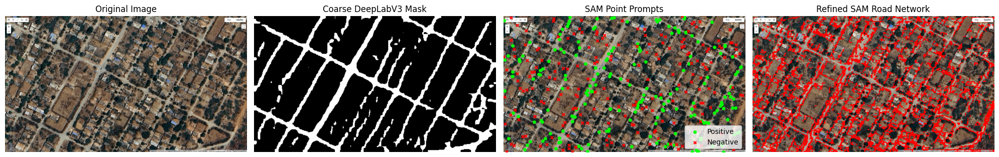

In [29]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os, glob

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Visualization Helper
# -------------------------------
def visualize_all(image, coarse_mask, points, labels, refined_mask):
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# 5. Run Pipeline (Single Image)
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load model once
    model = load_deeplabv3(weights_path, device)

    # Step 1: Coarse DeepLabV3 mask
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization
    visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# 6. Run Pipeline on Folder
# -------------------------------
def run_on_folder(weights_path, folder_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = load_deeplabv3(weights_path, device)

    image_paths = sorted(glob.glob(os.path.join(folder_path, "*.png")) + 
                         glob.glob(os.path.join(folder_path, "*.jpg")) + 
                         glob.glob(os.path.join(folder_path, "*.jpeg")))

    print(f"Found {len(image_paths)} images in {folder_path}")
    for img_path in image_paths:
        print(f"\nProcessing: {os.path.basename(img_path)}")
        image, coarse_mask = get_coarse_mask(model, img_path, device=device, threshold=0.4)
        points, labels = mask_to_points(coarse_mask, num_points=200)
        refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)
        visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/roadimages9/image5.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

# Single image
run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")

# OR run on a folder
# FOLDER_PATH  = "/kaggle/input/roadimages9/"
# run_on_folder(WEIGHTS_PATH, FOLDER_PATH, SAM_CKPT, model_type="vit_b")


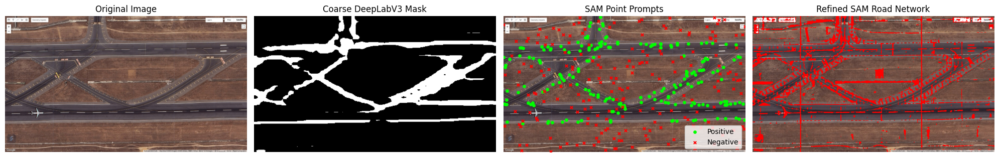

In [30]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os, glob

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Visualization Helper
# -------------------------------
def visualize_all(image, coarse_mask, points, labels, refined_mask):
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# 5. Run Pipeline (Single Image)
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load model once
    model = load_deeplabv3(weights_path, device)

    # Step 1: Coarse DeepLabV3 mask
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization
    visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# 6. Run Pipeline on Folder
# -------------------------------
def run_on_folder(weights_path, folder_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = load_deeplabv3(weights_path, device)

    image_paths = sorted(glob.glob(os.path.join(folder_path, "*.png")) + 
                         glob.glob(os.path.join(folder_path, "*.jpg")) + 
                         glob.glob(os.path.join(folder_path, "*.jpeg")))

    print(f"Found {len(image_paths)} images in {folder_path}")
    for img_path in image_paths:
        print(f"\nProcessing: {os.path.basename(img_path)}")
        image, coarse_mask = get_coarse_mask(model, img_path, device=device, threshold=0.4)
        points, labels = mask_to_points(coarse_mask, num_points=200)
        refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)
        visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/roadimages9/image6.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

# Single image
run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")

# OR run on a folder
# FOLDER_PATH  = "/kaggle/input/roadimages9/"
# run_on_folder(WEIGHTS_PATH, FOLDER_PATH, SAM_CKPT, model_type="vit_b")


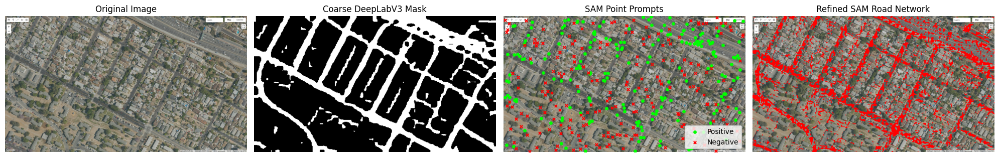

In [31]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os, glob

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Visualization Helper
# -------------------------------
def visualize_all(image, coarse_mask, points, labels, refined_mask):
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# 5. Run Pipeline (Single Image)
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load model once
    model = load_deeplabv3(weights_path, device)

    # Step 1: Coarse DeepLabV3 mask
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization
    visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# 6. Run Pipeline on Folder
# -------------------------------
def run_on_folder(weights_path, folder_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = load_deeplabv3(weights_path, device)

    image_paths = sorted(glob.glob(os.path.join(folder_path, "*.png")) + 
                         glob.glob(os.path.join(folder_path, "*.jpg")) + 
                         glob.glob(os.path.join(folder_path, "*.jpeg")))

    print(f"Found {len(image_paths)} images in {folder_path}")
    for img_path in image_paths:
        print(f"\nProcessing: {os.path.basename(img_path)}")
        image, coarse_mask = get_coarse_mask(model, img_path, device=device, threshold=0.4)
        points, labels = mask_to_points(coarse_mask, num_points=200)
        refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)
        visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/roadimages9/image8.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

# Single image
run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")

# OR run on a folder
# FOLDER_PATH  = "/kaggle/input/roadimages9/"
# run_on_folder(WEIGHTS_PATH, FOLDER_PATH, SAM_CKPT, model_type="vit_b")


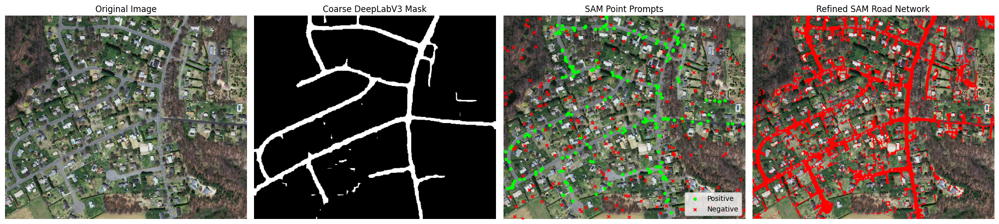

In [32]:
# ===============================================
# DeepLabV3 + SAM Road Extraction Refinement + Point Prompt Visualization
# ===============================================
import torch
import torch.nn as nn
import torchvision.models.segmentation as models
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os, glob

# Segment-Anything
from segment_anything import sam_model_registry, SamPredictor

# -------------------------------
# 1. DeepLabV3 (coarse mask)
# -------------------------------
def build_deeplabv3_binary(num_classes=1):
    model = models.deeplabv3_resnet50(weights=None, aux_loss=False)
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

def load_deeplabv3(weights_path, device="cuda"):
    model = build_deeplabv3_binary().to(device)
    state = torch.load(weights_path, map_location=device)
    model.load_state_dict(state, strict=False)
    model.eval()
    return model

def get_coarse_mask(model, image_path, device="cuda", max_dim=512, threshold=0.5):
    img_pil = Image.open(image_path).convert("RGB")
    orig_size = img_pil.size[::-1]  # (H,W)
    img_pil.thumbnail((max_dim,max_dim))
    img_tensor = T.ToTensor()(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        prob = torch.sigmoid(out)[0,0].cpu().numpy()

    mask = (prob >= threshold).astype(np.uint8)
    mask_resized = cv2.resize(mask, orig_size[::-1], interpolation=cv2.INTER_NEAREST)
    return np.array(Image.open(image_path).convert("RGB")), mask_resized

# -------------------------------
# 2. Mask → Point Prompts
# -------------------------------
def mask_to_points(mask, num_points=100):
    ys, xs = np.where(mask==1)
    pos_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    pos_points = np.stack([xs[pos_idx], ys[pos_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    ys, xs = np.where(mask==0)
    neg_idx = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False) if len(xs) > 0 else []
    neg_points = np.stack([xs[neg_idx], ys[neg_idx]], axis=-1) if len(xs) > 0 else np.zeros((0,2))

    points = np.concatenate([pos_points, neg_points], axis=0)
    labels = np.array([1]*len(pos_points) + [0]*len(neg_points))
    return points, labels

# -------------------------------
# 3. SAM Refinement
# -------------------------------
def refine_with_sam(image, points, labels, sam_checkpoint="sam_vit_b_01ec64.pth", model_type="vit_b", device="cuda"):
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
    predictor = SamPredictor(sam)

    predictor.set_image(image)
    masks, scores, logits = predictor.predict(
        point_coords=points,
        point_labels=labels,
        multimask_output=False
    )
    return masks[0]

# -------------------------------
# 4. Visualization Helper
# -------------------------------
def visualize_all(image, coarse_mask, points, labels, refined_mask):
    plt.figure(figsize=(20,5))

    # Original Image
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title("Original Image"); plt.axis("off")

    # Coarse DeepLabV3 Mask
    plt.subplot(1,4,2)
    plt.imshow(coarse_mask, cmap="gray")
    plt.title("Coarse DeepLabV3 Mask"); plt.axis("off")

    # SAM Point Prompts
    plt.subplot(1,4,3)
    plt.imshow(image)
    if len(points) > 0:
        pos_points = points[labels==1]
        neg_points = points[labels==0]
        if len(pos_points) > 0:
            plt.scatter(pos_points[:,0], pos_points[:,1], c="lime", s=15, marker="o", label="Positive")
        if len(neg_points) > 0:
            plt.scatter(neg_points[:,0], neg_points[:,1], c="red", s=15, marker="x", label="Negative")
        plt.legend(loc="lower right")
    plt.title("SAM Point Prompts"); plt.axis("off")

    # Refined SAM Mask (Overlay)
    plt.subplot(1,4,4)
    overlay = image.copy()
    overlay[refined_mask>0] = [255,0,0]
    plt.imshow(overlay)
    plt.title("Refined SAM Road Network"); plt.axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------------
# 5. Run Pipeline (Single Image)
# -------------------------------
def run_pipeline(weights_path, image_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load model once
    model = load_deeplabv3(weights_path, device)

    # Step 1: Coarse DeepLabV3 mask
    image, coarse_mask = get_coarse_mask(model, image_path, device=device, threshold=0.4)

    # Step 2: Convert to prompts
    points, labels = mask_to_points(coarse_mask, num_points=200)

    # Step 3: SAM refinement
    refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)

    # Step 4: Visualization
    visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# 6. Run Pipeline on Folder
# -------------------------------
def run_on_folder(weights_path, folder_path, sam_checkpoint, model_type="vit_b"):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = load_deeplabv3(weights_path, device)

    image_paths = sorted(glob.glob(os.path.join(folder_path, "*.png")) + 
                         glob.glob(os.path.join(folder_path, "*.jpg")) + 
                         glob.glob(os.path.join(folder_path, "*.jpeg")))

    print(f"Found {len(image_paths)} images in {folder_path}")
    for img_path in image_paths:
        print(f"\nProcessing: {os.path.basename(img_path)}")
        image, coarse_mask = get_coarse_mask(model, img_path, device=device, threshold=0.4)
        points, labels = mask_to_points(coarse_mask, num_points=200)
        refined_mask = refine_with_sam(image, points, labels, sam_checkpoint=sam_checkpoint, model_type=model_type, device=device)
        visualize_all(image, coarse_mask, points, labels, refined_mask)

# -------------------------------
# Example Run
# -------------------------------
WEIGHTS_PATH = "deeplabv3_last.pth"         
IMAGE_PATH   = "/kaggle/input/roadimages9/image9.jpg"      
SAM_CKPT     = "sam_vit_b_01ec64.pth"          

# Single image
run_pipeline(WEIGHTS_PATH, IMAGE_PATH, SAM_CKPT, model_type="vit_b")

# OR run on a folder
# FOLDER_PATH  = "/kaggle/input/roadimages9/"
# run_on_folder(WEIGHTS_PATH, FOLDER_PATH, SAM_CKPT, model_type="vit_b")
